In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import joblib

# Data Inspection

In [2]:
df=pd.read_csv("Insurance_Dataset_File.csv")

In [3]:
df.shape

(11338, 7)

In [4]:
df.head()

,age,sex,bmi,children,smoker,region,charges
0,56,male,23.639522,4,yes,northwest,30682.66947
1,46,female,18.709634,3,no,southeast,10308.78897
2,32,female,30.901009,0,yes,southeast,31642.91253
3,60,female,38.737386,3,no,northwest,11180.21208
4,25,male,39.918344,3,yes,southeast,45681.89185


In [5]:
df.tail()

,age,sex,bmi,children,smoker,region,charges
11333,50,male,30.97,3,no,northwest,10600.5483
11334,18,female,31.92,0,no,northeast,2205.9808
11335,18,female,36.85,0,no,southeast,1629.8335
11336,21,female,25.80,0,no,southwest,2007.9450
11337,61,female,29.07,0,yes,northwest,29141.3603


In [6]:
df.sample(5)

,age,sex,bmi,children,smoker,region,charges
2633,46,female,29.461831,3,yes,southwest,34302.033800
7083,43,male,18.604002,4,yes,northeast,29342.068480
9186,34,male,25.021579,4,no,southeast,9319.269075
1369,35,male,19.526572,1,no,southeast,9364.613329
339,36,female,36.110140,0,yes,southeast,29742.947500


In [7]:
df.describe()

,age,bmi,children,charges
count,11338.000000,11338.000000,11338.000000,11338.000000
mean,41.280208,27.967664,2.353325,21132.301135
std,13.805587,7.192101,1.712785,13726.047863
min,18.000000,15.003944,0.000000,1121.873900
25%,29.000000,21.971147,1.000000,9265.119383
50%,41.000000,28.140325,2.000000,14137.222170
75%,53.000000,34.000867,4.000000,33908.296418
max,65.000000,53.130000,5.000000,63770.428010


In [8]:
df.shape

(11338, 7)

In [9]:
df.size

79366

In [10]:
df.columns

Index(['age', 'sex', 'bmi', 'children', 'smoker', 'region', 'charges'], dtype='object')

In [11]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11338 entries, 0 to 11337
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       11338 non-null  int64  
 1   sex       11338 non-null  object 
 2   bmi       11338 non-null  float64
 3   children  11338 non-null  int64  
 4   smoker    11338 non-null  object 
 5   region    11338 non-null  object 
 6   charges   11338 non-null  float64
dtypes: float64(2), int64(2), object(3)
memory usage: 620.2+ KB
None


In [12]:
df.groupby(['smoker'])['charges'].mean()

smoker
no      9744.584009
yes    34786.076789
Name: charges, dtype: float64

In [13]:
df[df["smoker"]=="no"].sort_values(by="charges",ascending=False).head(10)

,age,sex,bmi,children,smoker,region,charges
11206,59,female,34.800,2,no,southwest,36910.60803
11012,61,female,33.330,4,no,southeast,36580.28216
10242,55,female,26.800,1,no,southwest,35160.13457
10599,52,female,37.525,2,no,northwest,33471.97189
10936,44,male,29.735,2,no,northeast,32108.66282
10573,62,female,36.860,1,no,northeast,31620.00106
10387,50,male,25.365,2,no,northwest,30284.64294
10115,60,male,28.595,0,no,northeast,30259.99556
10062,64,male,24.700,1,no,northwest,30166.61817
11258,55,male,37.715,3,no,northwest,30063.58055


In [14]:
print(df['sex'].unique())
print(df['sex'].nunique())


['male' 'female']
2


In [15]:
print(df['region'].unique())
print(df['region'].nunique())


['northwest' 'southeast' 'northeast' 'southwest']
4


In [16]:
print(df['age'].unique())
print(df['age'].nunique())


[56 46 32 60 25 38 36 40 28 41 53 57 20 39 19 61 47 55 50 29 42 44 59 45
 33 64 54 24 26 35 21 31 43 37 52 34 23 51 27 48 65 62 58 18 22 30 49 63]
48


In [17]:
print(df['children'].unique())
print(df['children'].nunique())


[4 3 0 2 1 5]
6


In [18]:
print(df['smoker'].value_counts())

no     6182
yes    5156
Name: smoker, dtype: int64


In [19]:
print(df.sort_values(by='age'))

       age     sex        bmi  children smoker     region      charges
1236    18    male  22.132443         1    yes  southeast  31117.10832
3442    18    male  39.986477         2     no  northeast  10438.38397
10612   18  female  33.155000         0     no  northeast   2207.69745
2145    18  female  28.278616         4    yes  northeast  42299.77689
10369   18    male  30.400000         3     no  northeast   3481.86800
...    ...     ...        ...       ...    ...        ...          ...
1653    65  female  15.888797         0    yes  northeast  35814.61862
8366    65    male  29.864961         2     no  southwest  11494.30484
8387    65  female  32.672523         5    yes  northeast  39414.29174
1852    65    male  24.990962         1    yes  northwest  41915.26073
4937    65  female  31.210598         0     no  southeast   8923.65251

[11338 rows x 7 columns]


In [20]:
print(df.isnull().sum())

age         0
sex         0
bmi         0
children    0
smoker      0
region      0
charges     0
dtype: int64


In [21]:
df.corr(numeric_only=True)

,age,bmi,children,charges
age,1.000000,-0.002357,0.010756,0.072645
bmi,-0.002357,1.000000,-0.025743,0.062492
children,0.010756,-0.025743,1.000000,0.106198
charges,0.072645,0.062492,0.106198,1.000000


In [22]:
df.skew(numeric_only=True)

age         0.002459
bmi        -0.029335
children    0.100687
charges     0.465001
dtype: float64

In [23]:
df.kurtosis(numeric_only=True)

age        -1.183742
bmi        -1.061194
children   -1.267628
charges    -1.206223
dtype: float64

In [24]:
print("Maximum Values:")
print(df.max(numeric_only=True))
print("\n")

# Display the minimum value in each column
print("Minimum Values:")
print(df.min(numeric_only=True))
print("\n")

# Display the mean of each numerical column
print("Mean Values:")
print(df.mean(numeric_only=True))
print("\n")

# Display the median of each numerical column
print("Median Values:")
print(df.median(numeric_only=True))
print("\n")

# Display the standard deviation of each numerical column
print("Standard Deviation:")
print(df.std(numeric_only=True))
print("\n")

Maximum Values:
age            65.00000
bmi            53.13000
children        5.00000
charges     63770.42801
dtype: float64


Minimum Values:
age           18.000000
bmi           15.003944
children       0.000000
charges     1121.873900
dtype: float64


Mean Values:
age            41.280208
bmi            27.967664
children        2.353325
charges     21132.301135
dtype: float64


Median Values:
age            41.000000
bmi            28.140325
children        2.000000
charges     14137.222170
dtype: float64


Standard Deviation:
age            13.805587
bmi             7.192101
children        1.712785
charges     13726.047863
dtype: float64




In [25]:
df[df['smoker'] == 'yes']

,age,sex,bmi,children,smoker,region,charges
0,56,male,23.639522,4,yes,northwest,30682.66947
2,32,female,30.901009,0,yes,southeast,31642.91253
4,25,male,39.918344,3,yes,southeast,45681.89185
5,38,male,24.381028,4,yes,northeast,42299.68423
6,56,male,29.975316,3,yes,northwest,28388.18935
...,...,...,...,...,...,...,...
11313,19,female,34.700000,2,yes,southwest,36397.57600
11314,30,female,23.655000,3,yes,northwest,18765.87545
11321,62,male,26.695000,0,yes,northeast,28101.33305
11323,42,female,40.370000,2,yes,southeast,43896.37630


In [26]:
# Smoker vs. Non-Smoker Analysis
smoker_vs_non_smoker = df.groupby('smoker')['charges'].mean()
print("\nSmoker vs. Non-Smoker Analysis:")
print(smoker_vs_non_smoker)


Smoker vs. Non-Smoker Analysis:
smoker
no      9744.584009
yes    34786.076789
Name: charges, dtype: float64


In [27]:
# Age vs. BMI Analysis
age_bmi_analysis = df.groupby('age')['bmi'].mean()
print("\nAge vs. BMI Analysis:")
print(age_bmi_analysis)


Age vs. BMI Analysis:
age
18    28.760982
19    27.800937
20    27.894385
21    27.702859
22    27.981782
23    28.322940
24    27.608441
25    27.479778
26    28.026842
27    28.376655
28    27.686598
29    28.170093
30    27.686364
31    27.630381
32    28.681726
33    28.048923
34    28.214619
35    28.874925
36    27.019888
37    28.055201
38    27.933200
39    27.111158
40    28.008985
41    28.192471
42    27.359679
43    28.033154
44    28.129260
45    27.668606
46    27.951859
47    27.697490
48    28.518404
49    27.823901
50    28.016981
51    28.400052
52    28.565063
53    28.070103
54    27.912882
55    27.964375
56    27.961577
57    27.494035
58    27.793761
59    27.903335
60    27.915931
61    28.443582
62    27.797627
63    28.159470
64    28.428677
65    26.904266
Name: bmi, dtype: float64


In [28]:
# Average Charges by Region
avg_charges_by_region = df.groupby('region')['charges'].mean()
print("\nAverage Charges by Region:")
print(avg_charges_by_region)


Average Charges by Region:
region
northeast    21015.985715
northwest    21396.521259
southeast    21182.935376
southwest    20927.796562
Name: charges, dtype: float64


In [29]:
# Gender-wise Analysis
gender_analysis = df.groupby('sex')['charges'].mean()
print("\nGender-wise Analysis:")
print(gender_analysis)


Gender-wise Analysis:
sex
female    21148.766988
male      21115.864302
Name: charges, dtype: float64


In [30]:
# Region-wise Analysis
region_analysis = df.groupby('region')['charges'].mean()
print("\nRegion-wise Analysis:")
print(region_analysis)


Region-wise Analysis:
region
northeast    21015.985715
northwest    21396.521259
southeast    21182.935376
southwest    20927.796562
Name: charges, dtype: float64


In [31]:
# Relationship between BMI and Charges
bmi_charges_relation = df.groupby('bmi')['charges'].mean()
print("\nRelationship between BMI and Charges:")
bmi_charges_relation


Relationship between BMI and Charges:


bmi
15.003944    33373.025230
15.006311    44027.439440
15.007743    33415.998580
15.008254    32022.375750
15.013855     4842.601629
                 ...     
48.070000     9432.925300
49.060000    11381.325400
50.380000     2438.055200
52.580000    44501.398200
53.130000     1163.462700
Name: charges, Length: 10548, dtype: float64

In [32]:
# Relationship between Age and Charges
age_charges_relation = df.groupby('age')['charges'].mean()
print("\nRelationship between Age and Charges:")
age_charges_relation


Relationship between Age and Charges:


age
18    16146.638748
19    18279.362685
20    19463.202114
21    19719.866421
22    19961.718118
23    20494.554777
24    21261.487731
25    21190.050390
26    20819.716386
27    20896.403279
28    21848.875049
29    19119.181063
30    20161.625873
31    21839.371820
32    20070.326131
33    20070.868120
34    21131.329322
35    20007.860684
36    21030.852224
37    22036.140225
38    21393.305786
39    19764.052159
40    21052.673483
41    20323.984848
42    22009.839236
43    22470.973387
44    21658.904304
45    21997.493217
46    20864.341636
47    21375.090543
48    20055.368058
49    21254.312840
50    22707.469522
51    22052.712634
52    23657.021641
53    21451.587422
54    20300.841232
55    21428.047414
56    20722.775193
57    22255.870192
58    21217.860319
59    22894.271985
60    21423.331404
61    23124.733893
62    22598.487649
63    22828.168113
64    23915.682981
65    23105.872467
Name: charges, dtype: float64

In [33]:
# Smoker vs. Non-Smoker Age Distribution
smoker_age_distribution = df.groupby('smoker')['age'].describe()
print("\nSmoker vs. Non-Smoker Age Distribution:")
smoker_age_distribution


Smoker vs. Non-Smoker Age Distribution:


,count,mean,std,min,25%,50%,75%,max
smoker,,,,,,,,
no,6182.0,41.128114,13.830781,18.0,29.0,41.0,53.0,65.0
yes,5156.0,41.462568,13.774446,18.0,30.0,41.5,53.0,65.0


In [34]:
# Charges Distribution for Smokers and Non-Smokers
charges_distribution_smoker_non_smoker = df.groupby('smoker')['charges'].describe()
print("\nCharges Distribution for Smokers and Non-Smokers:")
charges_distribution_smoker_non_smoker


Charges Distribution for Smokers and Non-Smokers:


,count,mean,std,min,25%,50%,75%,max
smoker,,,,,,,,
no,6182.0,9744.584009,3593.933865,1121.873900,7633.890640,9560.28157,11597.215320,36910.60803
yes,5156.0,34786.076789,7541.824113,3585.477438,29778.969578,34821.57099,39639.362268,63770.42801


In [35]:
# Average Charges for Different Number of Children
avg_charges_children = df.groupby('children')['charges'].mean()
print("\nAverage Charges for Different Number of Children:")
avg_charges_children


Average Charges for Different Number of Children:


children
0    19116.241132
1    19457.624040
2    21509.784081
3    21655.956107
4    22760.282521
5    23012.964045
Name: charges, dtype: float64

In [36]:
gender_smoker_charges = df.groupby(['sex', 'smoker'])['charges'].mean()
print("\nAverage Charges for Male and Female Smokers:")
print(gender_smoker_charges)


Average Charges for Male and Female Smokers:
sex     smoker
female  no         9765.033573
        yes       34873.081105
male    no         9724.068179
        yes       34699.744841
Name: charges, dtype: float64


In [37]:
# Average Charges for Different Regions
avg_charges_region = df.groupby('region')['charges'].mean()
print("\nAverage Charges for Different Regions:")
print(avg_charges_region)


Average Charges for Different Regions:
region
northeast    21015.985715
northwest    21396.521259
southeast    21182.935376
southwest    20927.796562
Name: charges, dtype: float64


In [38]:
charges_distribution_children = df.groupby('children')['charges'].describe()
print("\nCharges Distribution for Different Numbers of Children:")
charges_distribution_children


Charges Distribution for Different Numbers of Children:


,count,mean,std,min,25%,50%,75%,max
children,,,,,,,,
0,2196.0,19116.241132,13773.308904,1121.873900,7809.248127,12223.624575,32286.463502,63770.42801
1,1964.0,19457.624040,13312.853879,1711.026800,8433.240530,12017.339820,31957.834642,58792.70655
2,1937.0,21509.784081,13845.835190,2304.002200,9075.165968,14486.479440,34549.165830,55268.55961
3,1781.0,21655.956107,13661.416517,2918.038507,9702.933753,14262.511770,34606.502920,60021.39897
4,1799.0,22760.282521,13669.670126,2765.644249,10408.804185,16668.458010,35277.214970,58534.65072
5,1661.0,23012.964045,13587.392459,2780.999463,10947.788530,16294.454860,35494.822130,56541.66295


In [39]:
avg_charges_gender = df.groupby('sex')['charges'].mean()
print("\nAverage Charges for Male and Female:")
print(avg_charges_gender)


Average Charges for Male and Female:
sex
female    21148.766988
male      21115.864302
Name: charges, dtype: float64


In [40]:
for column in df.columns:
    print(f"Column: {column}")
    print(df[column].value_counts())
    print()
    
# This code loops through each column in a DataFrame (df), displays the column name,
# and prints the count of distinct values using value_counts(). 
# It adds a blank line for clarity before moving to the next column.

Column: age
19    284
43    267
18    261
45    258
40    257
34    256
52    252
62    252
46    252
35    248
56    247
64    246
30    246
49    245
29    245
42    245
54    245
38    244
41    241
59    241
51    240
25    238
28    238
39    237
32    237
57    236
23    235
20    234
21    234
37    234
50    233
61    232
53    232
55    229
22    228
47    228
33    227
36    226
31    222
27    221
26    221
24    214
63    212
58    210
60    209
48    202
44    202
65    195
Name: age, dtype: int64

Column: sex
male      5674
female    5664
Name: sex, dtype: int64

Column: bmi
32.300000    13
28.310000     9
30.495000     8
30.800000     8
34.100000     8
             ..
25.163458     1
36.646037     1
38.472083     1
39.818115     1
30.970000     1
Name: bmi, Length: 10548, dtype: int64

Column: children
0    2196
1    1964
2    1937
4    1799
3    1781
5    1661
Name: children, dtype: int64

Column: smoker
no     6182
yes    5156
Name: smoker, dtype: int64

Column: region

# Insruance Exploratory Data Analysis (EDA)

In [41]:
float_columns = df.select_dtypes(include='float').columns
integer_columns = df.select_dtypes(include='integer').columns

for column in float_columns:  
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    outliers = df[(df[column] < (Q1 - 1.5 * IQR)) | (df[column] > (Q3 + 1.5 * IQR))]

    
    print(f"Outliers in float column {column}:")
    print(outliers)
    print("\n")


for column in integer_columns:
    
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1

    
    outliers = df[(df[column] < (Q1 - 1.5 * IQR)) | (df[column] > (Q3 + 1.5 * IQR))]


    print(f"Outliers in integer column {column}:")
    print(outliers)
    print("\n")
    

Outliers in float column bmi:
       age   sex    bmi  children smoker     region     charges
11047   22  male  52.58         1    yes  southeast  44501.3982
11317   18  male  53.13         0     no  southeast   1163.4627


Outliers in float column charges:
Empty DataFrame
Columns: [age, sex, bmi, children, smoker, region, charges]
Index: []


Outliers in integer column age:
Empty DataFrame
Columns: [age, sex, bmi, children, smoker, region, charges]
Index: []


Outliers in integer column children:
Empty DataFrame
Columns: [age, sex, bmi, children, smoker, region, charges]
Index: []




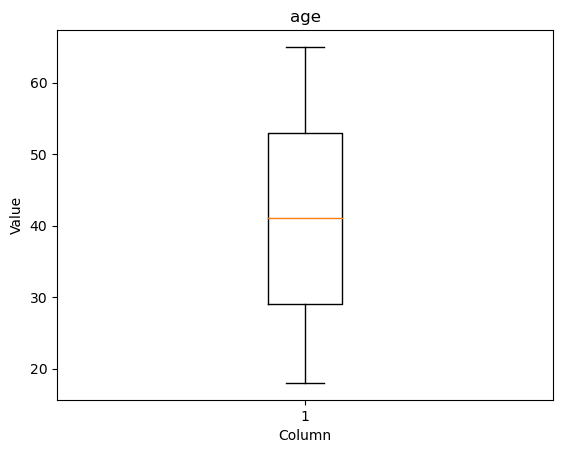

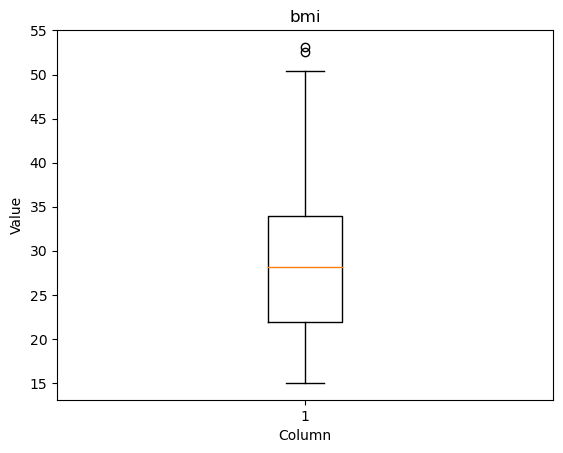

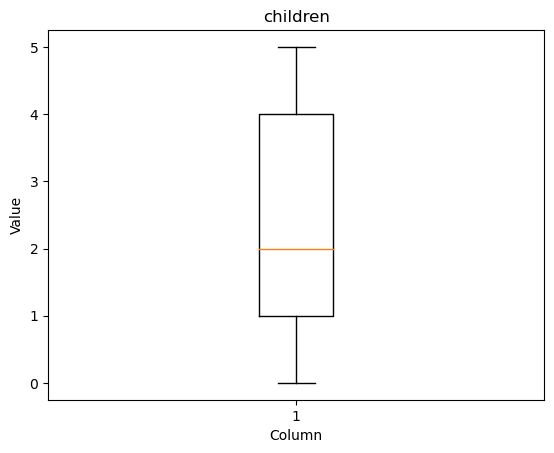

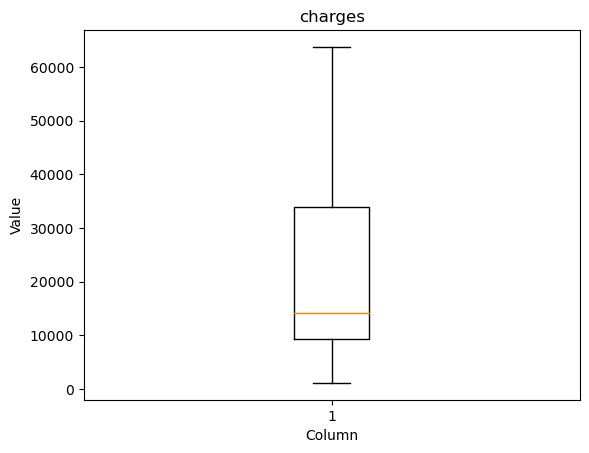

In [42]:
numeric_cols = df.select_dtypes(include=['int', 'float']).columns.tolist()
for column in numeric_cols:
    plt.figure()  
    plt.boxplot(df[column].dropna())  
    plt.title(column)
    plt.xlabel('Column')
    plt.ylabel('Value') 
    plt.show() 

In [43]:
import numpy as np
Q1 = df['bmi'].quantile(0.25)
Q3 = df['bmi'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers_count = len(df[(df['bmi'] < lower_bound) | (df['bmi'] > upper_bound)])

print("Number of outliers:", outliers_count)


Number of outliers: 2


In [44]:
import numpy as np
Q1 = df['charges'].quantile(0.25)
Q3 = df['charges'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers_count = len(df[(df['charges'] < lower_bound) | (df['charges'] > upper_bound)])

print("Number of outliers:", outliers_count)


Number of outliers: 0


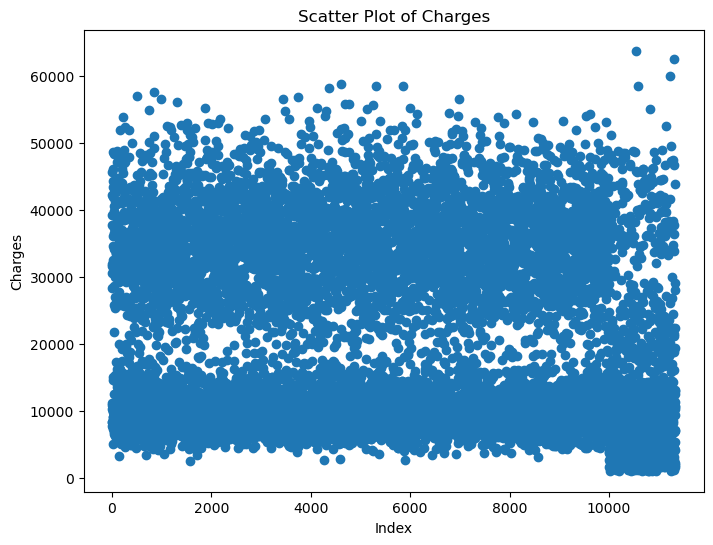

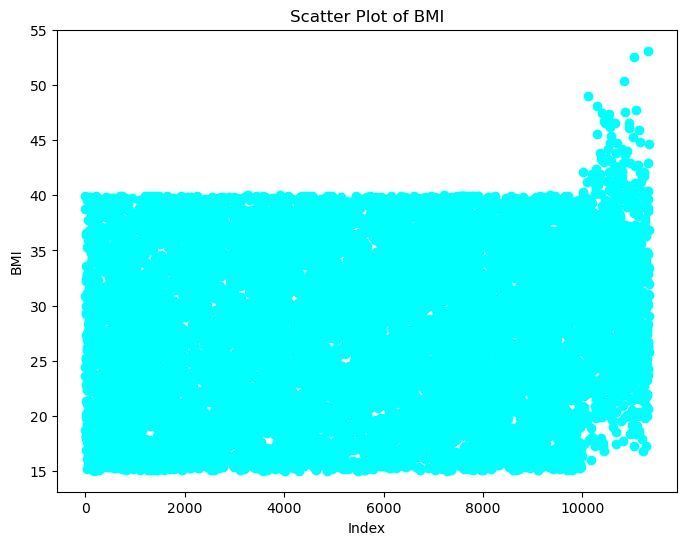

In [45]:
plt.figure(figsize=(8, 6))
plt.scatter(df.index, df['charges'])
plt.title('Scatter Plot of Charges')
plt.xlabel('Index')
plt.ylabel('Charges')
plt.show()

# Create the second scatter plot for 'bmi' column
plt.figure(figsize=(8, 6))
plt.scatter(df.index, df['bmi'],color='cyan')
plt.title('Scatter Plot of BMI')
plt.xlabel('Index')
plt.ylabel('BMI')
plt.show()

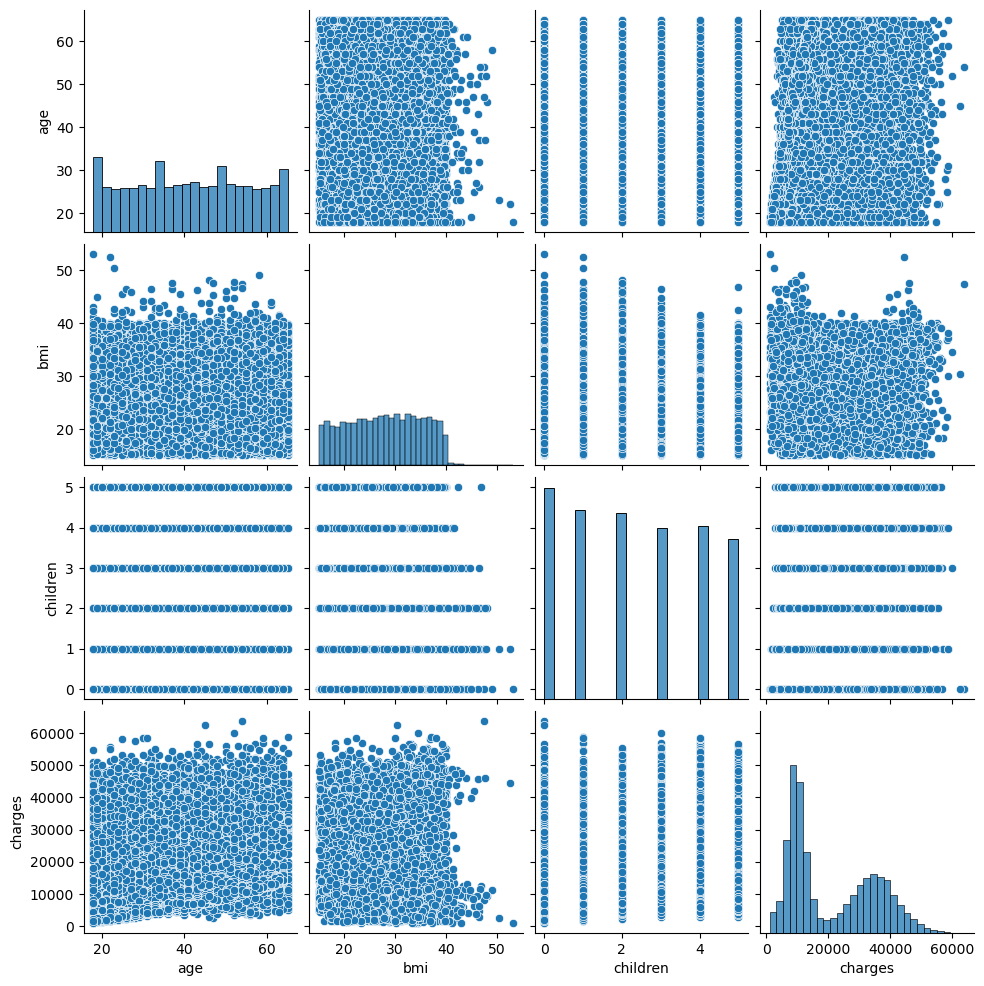

In [46]:
sns.pairplot(df)

In [47]:
column_names = ['region', 'age', 'sex', 'smoker', 'children' ,'bmi']
for column in column_names:
    fig = px.histogram(df, x=column, color_discrete_sequence=px.colors.qualitative.Pastel)
    fig.update_layout(
        title=column,
        xaxis_title="Value",
        yaxis_title="Frequency"
    )
    fig.show()

In [48]:
age_ranges = [
    (0, 2, 'Baby'),
    (3, 16, 'Children'),
    (17, 30, 'Young Adults'), 
    (31, 45, 'Old Adults'),
    (46, float('inf'), 'Older Adults')
]
df['Age_Category'] = pd.cut(df['age'], bins=[start-0.5 for start, _, _ in age_ranges] + [float('inf')], 
                            labels=[category for _, _, category in age_ranges], right=False)
df

,age,sex,bmi,children,smoker,region,charges,Age_Category
0,56,male,23.639522,4,yes,northwest,30682.66947,Older Adults
1,46,female,18.709634,3,no,southeast,10308.78897,Older Adults
2,32,female,30.901009,0,yes,southeast,31642.91253,Old Adults
3,60,female,38.737386,3,no,northwest,11180.21208,Older Adults
4,25,male,39.918344,3,yes,southeast,45681.89185,Young Adults
...,...,...,...,...,...,...,...,...
11333,50,male,30.970000,3,no,northwest,10600.54830,Older Adults
11334,18,female,31.920000,0,no,northeast,2205.98080,Young Adults
11335,18,female,36.850000,0,no,southeast,1629.83350,Young Adults
11336,21,female,25.800000,0,no,southwest,2007.94500,Young Adults


In [49]:
bmi_ranges = [
    (float('-inf'), 16.0, 'Underweight (Severe thinness)'),
    (16.0, 16.9, 'Underweight (Moderate thinness)'),
    (17.0, 18.4, 'Underweight (Mild thinness)'),
    (18.5, 24.9, 'Normal range'),
    (25.0, 29.9, 'Overweight (Pre-obese)'),
    (30.0, 34.9, 'Obese (Class I)'),
    (35.0, 39.9, 'Obese (Class II)'),
    (40.0, float('inf'), 'Obese (Class III)')
]

# Create a new column 'BMI Category' and assign the corresponding category for each BMI value
df['BMI_Category'] = pd.cut(df['bmi'], bins=[start for start, _, _ in bmi_ranges] + [float('inf')], 
                            labels=[category for _, _, category in bmi_ranges], right=False)

# Print the DataFrame with the 'BMI Category' column
df

,age,sex,bmi,children,smoker,region,charges,Age_Category,BMI_Category
0,56,male,23.639522,4,yes,northwest,30682.66947,Older Adults,Normal range
1,46,female,18.709634,3,no,southeast,10308.78897,Older Adults,Normal range
2,32,female,30.901009,0,yes,southeast,31642.91253,Old Adults,Obese (Class I)
3,60,female,38.737386,3,no,northwest,11180.21208,Older Adults,Obese (Class II)
4,25,male,39.918344,3,yes,southeast,45681.89185,Young Adults,Obese (Class II)
...,...,...,...,...,...,...,...,...,...
11333,50,male,30.970000,3,no,northwest,10600.54830,Older Adults,Obese (Class I)
11334,18,female,31.920000,0,no,northeast,2205.98080,Young Adults,Obese (Class I)
11335,18,female,36.850000,0,no,southeast,1629.83350,Young Adults,Obese (Class II)
11336,21,female,25.800000,0,no,southwest,2007.94500,Young Adults,Overweight (Pre-obese)


In [50]:
column_names = ['BMI_Category', 'Age_Category']
for column in column_names:
    fig = px.histogram(df, x=column)
    fig.update_layout(
        title=column,
        xaxis_title="Value",
        yaxis_title="Frequency"
    )
    fig.show()

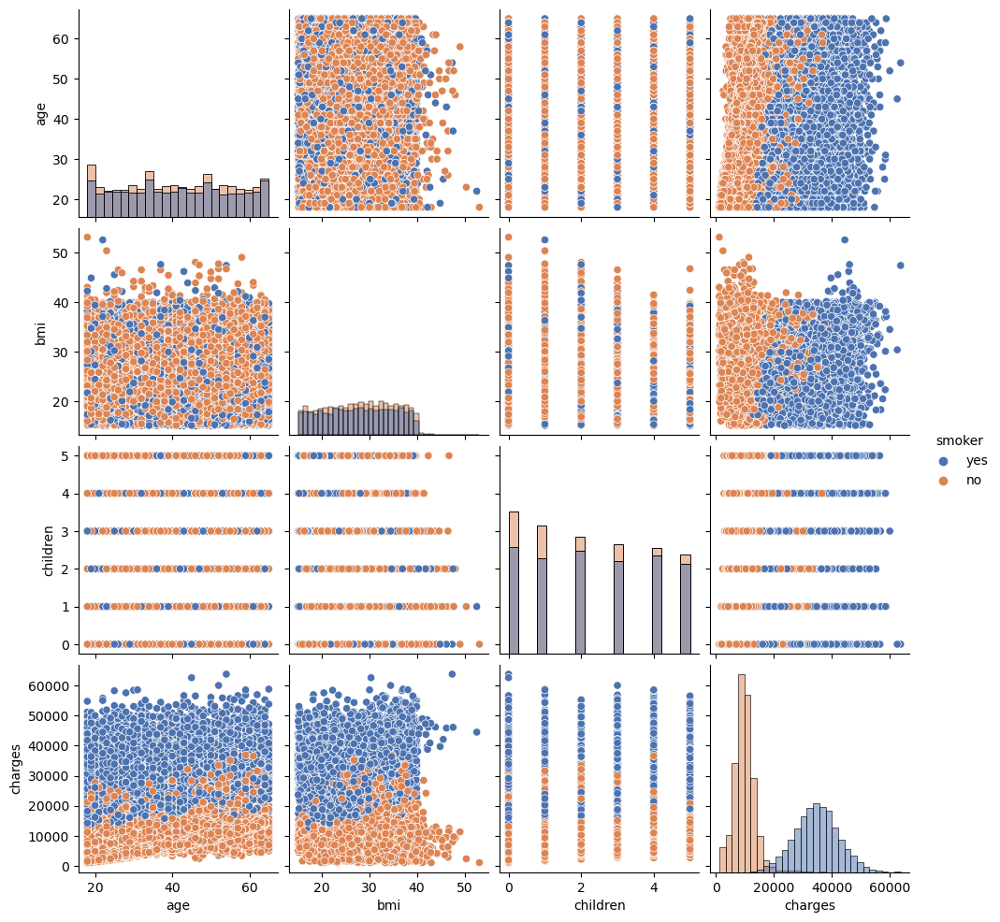

In [51]:
sns.pairplot(df,hue="smoker",palette="deep",diag_kind="hist")

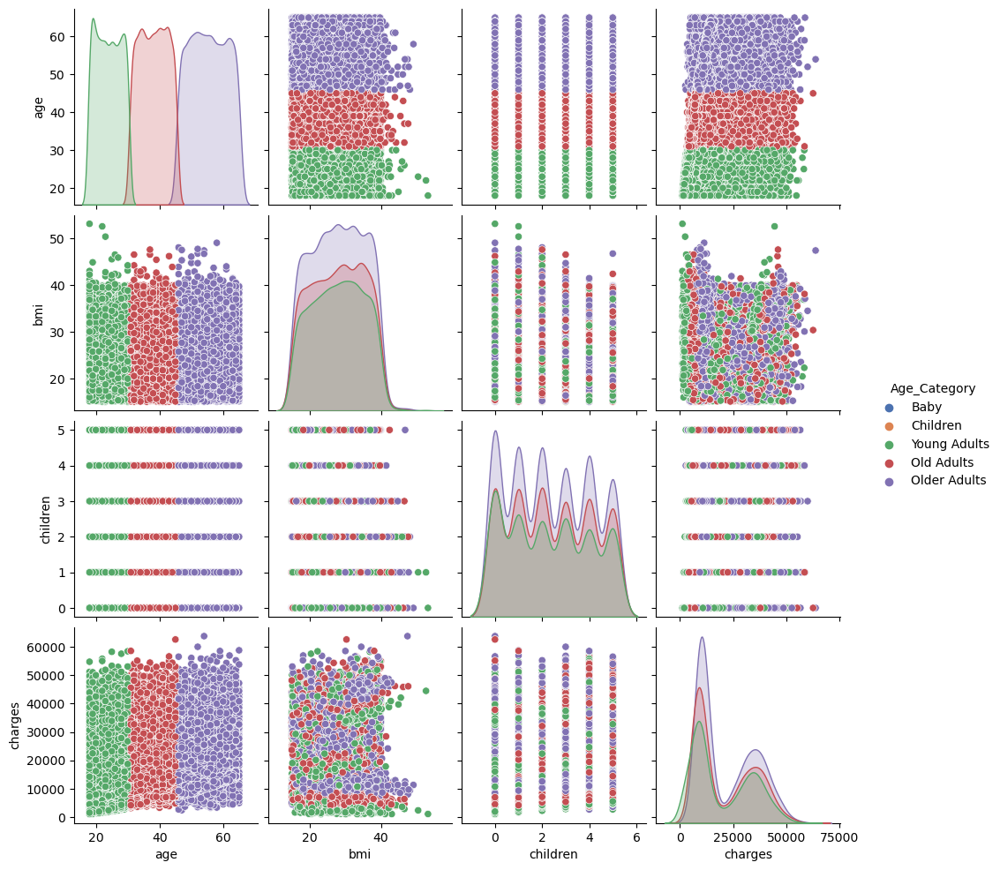

In [52]:
sns.pairplot(df,hue="Age_Category",palette="deep")

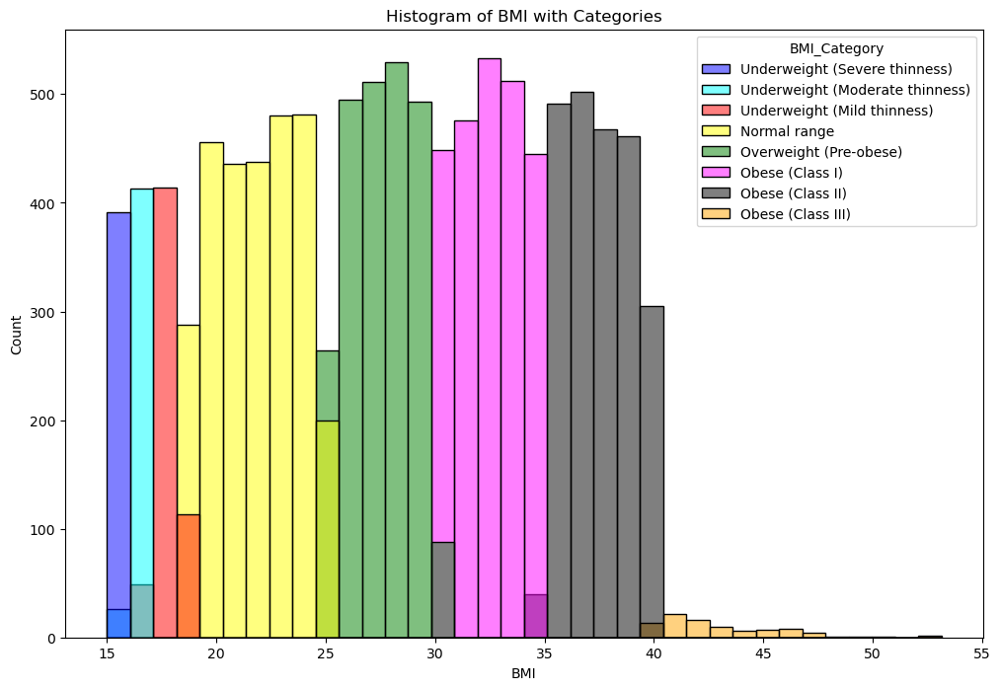

In [53]:
custom_palette = ["blue", "cyan", "red", "yellow", "green", "magenta", "black", "orange"]
plt.figure(figsize=(12, 8))
sns.histplot(data=df, x='bmi', hue='BMI_Category', palette=custom_palette)
plt.title('Histogram of BMI with Categories')
plt.xlabel('BMI')
plt.ylabel('Count')
plt.show()

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_14820\1633498967.py:2: MatplotlibDeprecationWarning:

Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.



Text(0, 0.5, 'Count')

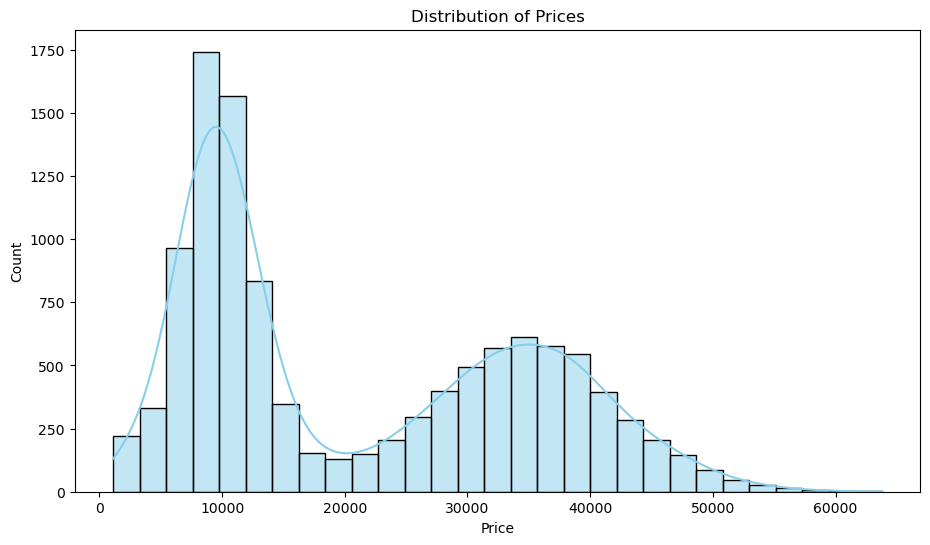

In [54]:
plt.subplots(figsize=(24, 6))
plt.subplot(1, 2, 2)
sns.histplot(x='charges', data=df, kde=True, color='skyblue')
plt.title('Distribution of Prices')
plt.xlabel('Price')
plt.ylabel('Count')

In [55]:
cross_table = pd.crosstab(df['Age_Category'], df['BMI_Category'])
styled_table = cross_table.style.background_gradient(cmap='Blues')
styled_table

BMI_Category,Underweight (Severe thinness),Underweight (Moderate thinness),Underweight (Mild thinness),Normal range,Overweight (Pre-obese),Obese (Class I),Obese (Class II),Obese (Class III)
Age_Category,,,,,,,,
Young Adults,104,122,148,759,662,683,596,25
Old Adults,133,135,190,876,749,780,713,25
Older Adults,154,182,238,1144,969,952,958,41


In [56]:
cross_table = pd.crosstab(df['smoker'], df['Age_Category'])
styled_table = cross_table.style.background_gradient(cmap='Blues')
styled_table

Age_Category,Young Adults,Old Adults,Older Adults
smoker,,,
no,1711,1943,2528
yes,1388,1658,2110


In [57]:
cross_table = pd.crosstab(df['children'], df['Age_Category'])
styled_table = cross_table.style.background_gradient(cmap='Blues')
styled_table

Age_Category,Young Adults,Old Adults,Older Adults
children,,,
0,662,641,893
1,525,631,808
2,492,639,806
3,508,567,706
4,449,583,767
5,463,540,658


In [58]:
import plotly.graph_objects as go
data = df
grouped_data = data.groupby('sex')['charges'].sum()
fig = go.Figure(data=[go.Bar(x=grouped_data.index, y=grouped_data.values)])
fig.update_layout(
    title='Total Charges by Gender',
    xaxis=dict(title='Sex'),
    yaxis=dict(title='Total Charges')
)
fig.show()

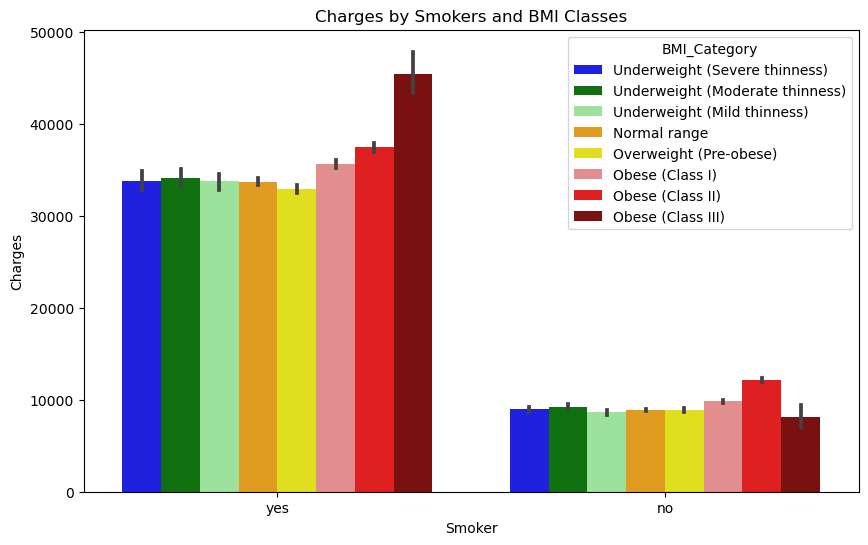

In [59]:
color_palette = {
    'Underweight (Severe thinness)': 'blue',
    'Underweight (Moderate thinness)': 'green',
    'Underweight (Mild thinness)': 'lightgreen',
    'Normal range': 'orange',
    'Overweight (Pre-obese)': 'yellow',
    'Obese (Class I)': 'lightcoral',
    'Obese (Class II)': 'red',
    'Obese (Class III)': 'darkred'
}

# Set the figure size
fig, ax = plt.subplots(figsize=(10, 6))

# Create the bar plot using Seaborn
sns.barplot(data=df, x='smoker', y='charges', hue='BMI_Category', palette=color_palette)

# Set the chart title and axis labels
plt.title('Charges by Smokers and BMI Classes')
plt.xlabel('Smoker')
plt.ylabel('Charges')

# Show the plot
plt.show()


In [60]:
import plotly.graph_objects as go

# Define markers for 'smoker' column
markers = {'yes': 'square', 'no': 'x'}

# Define colors for 'BMI_Category'
colors = {
    'Underweight (Severe thinness)': 'blue',
    'Underweight (Moderate thinness)': 'green',
    'Underweight (Mild thinness)': 'lightgreen',
    'Normal range': 'orange',
    'Overweight (Pre-obese)': 'yellow',
    'Obese (Class I)': 'lightcoral',
    'Obese (Class II)': 'red',
    'Obese (Class III)': 'darkred'
}

# Create the scatter plot using Plotly
fig = go.Figure()

# Add traces for each combination of 'BMI_Category' and 'smoker'
for bmi_class in df['BMI_Category'].unique():
    for smoker in df['smoker'].unique():
        data_filtered = df[(df['BMI_Category'] == bmi_class) & (df['smoker'] == smoker)]
        fig.add_trace(go.Scatter(
            x=data_filtered['age'],
            y=data_filtered['charges'],
            mode='markers',
            marker_symbol=markers[smoker],
            marker_color=colors[bmi_class],
            name=f"BMI: {bmi_class}, Smoker: {smoker}"
        ))

# Set the chart title and axis labels
fig.update_layout(
    title='Scatter Plot: Charges by Age',
    xaxis_title='Age',
    yaxis_title='Charges'
)

# Show the plot
fig.show()


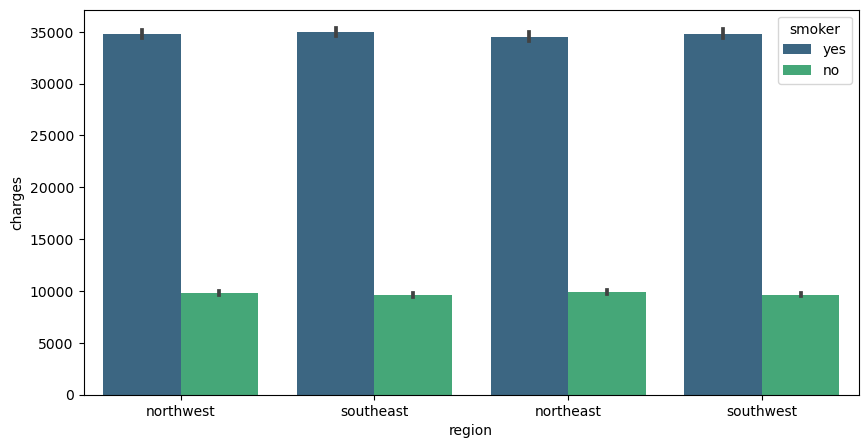

In [61]:
f, ax = plt.subplots(1, 1, figsize=(10, 5))
ax = sns.barplot(x = 'region', y = 'charges', data=df,
                 orient='v', hue='smoker', palette='viridis')

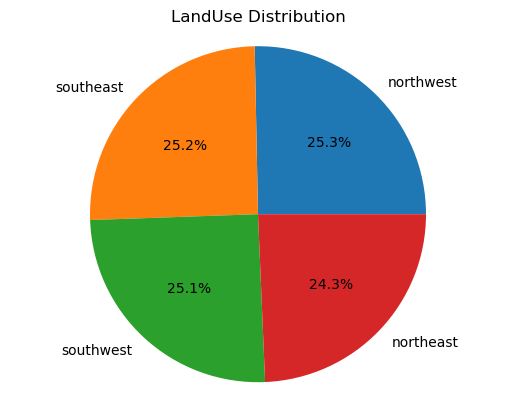

In [62]:
landuse_counts = df['region'].value_counts()
fig, ax = plt.subplots()
ax.pie(landuse_counts.values, labels=landuse_counts.index, autopct='%1.1f%%')
ax.set_title('LandUse Distribution')
ax.axis('equal')
plt.show()

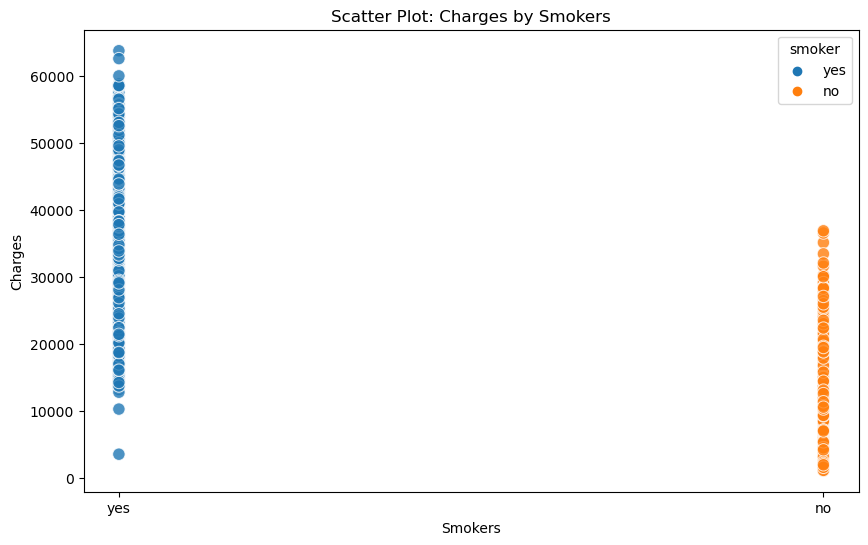

In [63]:

plt.figure(figsize=(10, 6))

# Create the scatter plot using Seaborn
sns.scatterplot(data=df, x='smoker', y='charges', hue='smoker', s=80, alpha=0.8)

# Set the chart title and axis labels
plt.title('Scatter Plot: Charges by Smokers')
plt.xlabel('Smokers')
plt.ylabel('Charges')

# Show the plot
plt.show()


In [64]:
df.head()

,age,sex,bmi,children,smoker,region,charges,Age_Category,BMI_Category
0,56,male,23.639522,4,yes,northwest,30682.66947,Older Adults,Normal range
1,46,female,18.709634,3,no,southeast,10308.78897,Older Adults,Normal range
2,32,female,30.901009,0,yes,southeast,31642.91253,Old Adults,Obese (Class I)
3,60,female,38.737386,3,no,northwest,11180.21208,Older Adults,Obese (Class II)
4,25,male,39.918344,3,yes,southeast,45681.89185,Young Adults,Obese (Class II)


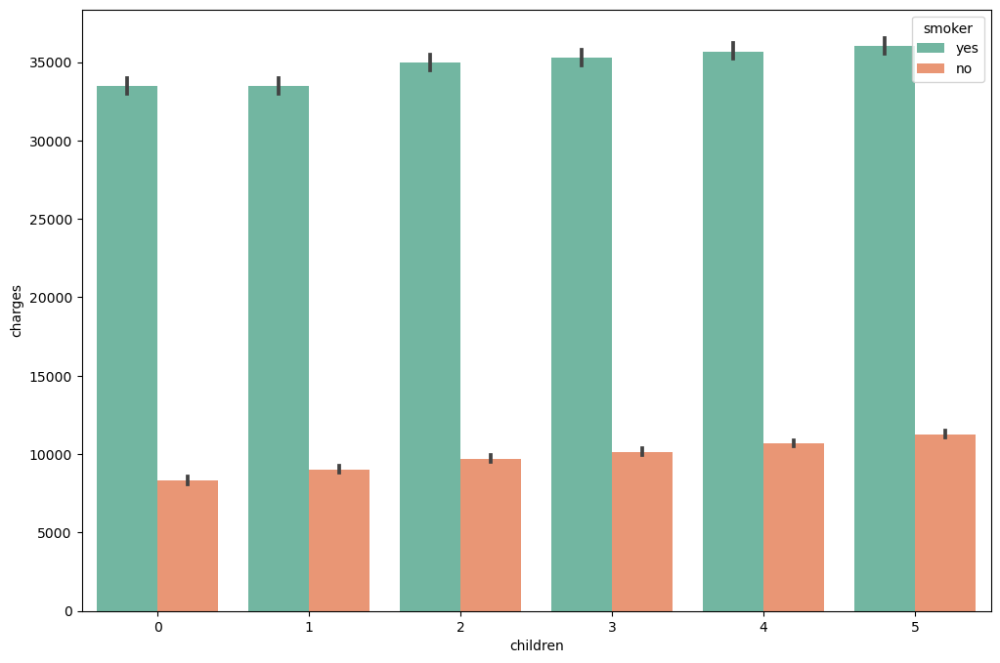

In [65]:
f, ax = plt.subplots(1, 1, figsize=(12, 8))
ax = sns.barplot(x='children', y='charges', hue='smoker', data=df, palette='Set2')

In [66]:
label = LabelEncoder()
df["sex"] = label.fit_transform(df["sex"]) 
df["smoker"] = label.fit_transform(df["smoker"]) 
df["region"] = label.fit_transform(df["region"]) 

In [67]:
df.head()

,age,sex,bmi,children,smoker,region,charges,Age_Category,BMI_Category
0,56,1,23.639522,4,1,1,30682.66947,Older Adults,Normal range
1,46,0,18.709634,3,0,2,10308.78897,Older Adults,Normal range
2,32,0,30.901009,0,1,2,31642.91253,Old Adults,Obese (Class I)
3,60,0,38.737386,3,0,1,11180.21208,Older Adults,Obese (Class II)
4,25,1,39.918344,3,1,2,45681.89185,Young Adults,Obese (Class II)


C:\Users\LENOVO\AppData\Local\Temp\ipykernel_14820\2983282606.py:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



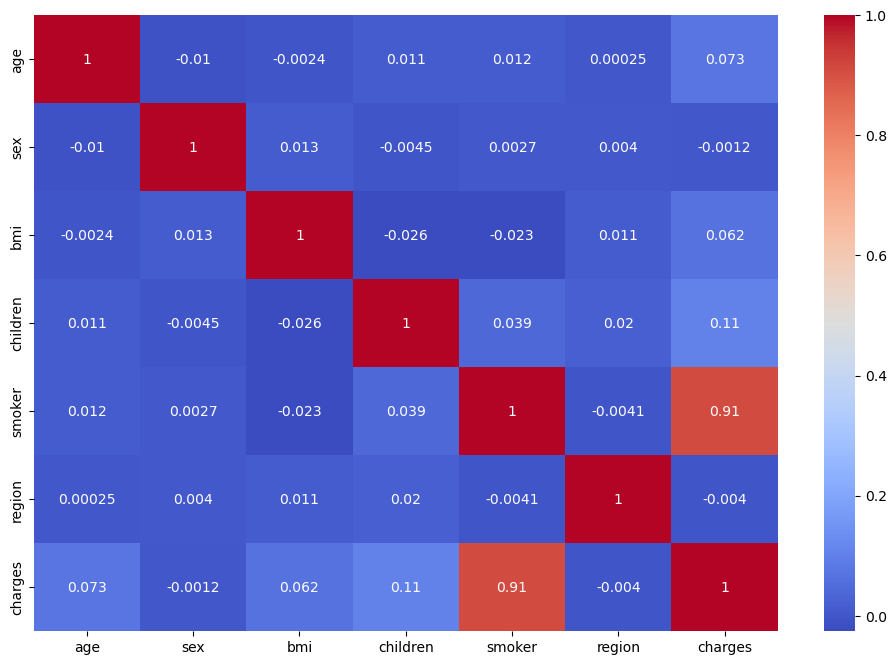

In [68]:
corr = df.corr()
plt.figure(figsize=(12,8))
ax = sns.heatmap(corr, cmap='coolwarm', annot=True)
fig = ax.get_figure()

In [69]:
df

,age,sex,bmi,children,smoker,region,charges,Age_Category,BMI_Category
0,56,1,23.639522,4,1,1,30682.66947,Older Adults,Normal range
1,46,0,18.709634,3,0,2,10308.78897,Older Adults,Normal range
2,32,0,30.901009,0,1,2,31642.91253,Old Adults,Obese (Class I)
3,60,0,38.737386,3,0,1,11180.21208,Older Adults,Obese (Class II)
4,25,1,39.918344,3,1,2,45681.89185,Young Adults,Obese (Class II)
...,...,...,...,...,...,...,...,...,...
11333,50,1,30.970000,3,0,1,10600.54830,Older Adults,Obese (Class I)
11334,18,0,31.920000,0,0,0,2205.98080,Young Adults,Obese (Class I)
11335,18,0,36.850000,0,0,2,1629.83350,Young Adults,Obese (Class II)
11336,21,0,25.800000,0,0,3,2007.94500,Young Adults,Overweight (Pre-obese)


In [70]:
# Drop the specified columns
df = df.drop(['Age_Category', 'BMI_Category'], axis=1)


In [71]:
df

,age,sex,bmi,children,smoker,region,charges
0,56,1,23.639522,4,1,1,30682.66947
1,46,0,18.709634,3,0,2,10308.78897
2,32,0,30.901009,0,1,2,31642.91253
3,60,0,38.737386,3,0,1,11180.21208
4,25,1,39.918344,3,1,2,45681.89185
...,...,...,...,...,...,...,...
11333,50,1,30.970000,3,0,1,10600.54830
11334,18,0,31.920000,0,0,0,2205.98080
11335,18,0,36.850000,0,0,2,1629.83350
11336,21,0,25.800000,0,0,3,2007.94500


In [72]:
# Perform one-hot encoding on the 'region' column
df = pd.get_dummies(df, columns=['region'])

# Display the encoded DataFrame
print(df.head())

   age  sex        bmi  children  smoker      charges  region_0  region_1  \
0   56    1  23.639522         4       1  30682.66947         0         1   
1   46    0  18.709634         3       0  10308.78897         0         0   
2   32    0  30.901009         0       1  31642.91253         0         0   
3   60    0  38.737386         3       0  11180.21208         0         1   
4   25    1  39.918344         3       1  45681.89185         0         0   

   region_2  region_3  
0         0         0  
1         1         0  
2         1         0  
3         0         0  
4         1         0  


In [73]:
df

,age,sex,bmi,children,smoker,charges,region_0,region_1,region_2,region_3
0,56,1,23.639522,4,1,30682.66947,0,1,0,0
1,46,0,18.709634,3,0,10308.78897,0,0,1,0
2,32,0,30.901009,0,1,31642.91253,0,0,1,0
3,60,0,38.737386,3,0,11180.21208,0,1,0,0
4,25,1,39.918344,3,1,45681.89185,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...
11333,50,1,30.970000,3,0,10600.54830,0,1,0,0
11334,18,0,31.920000,0,0,2205.98080,1,0,0,0
11335,18,0,36.850000,0,0,1629.83350,0,0,1,0
11336,21,0,25.800000,0,0,2007.94500,0,0,0,1


In [74]:
dsfdglgkndflk

NameError: name 'dsfdglgkndflk' is not defined

In [ ]:


# Step 2: Split the data into training and testing sets
X = df.drop('charges', axis=1)
y = df['charges']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 3: Define the models with hyperparameter tuning
models = {
    "Random Forest": RandomForestRegressor(),
    "Decision Tree": DecisionTreeRegressor(),
    "Gradient Boosting": GradientBoostingRegressor(),
    "Linear Regression": LinearRegression(),
    "XGBRegressor": XGBRegressor(),
    "CatBoosting Regressor": CatBoostRegressor(verbose=False),
    "AdaBoost Regressor": AdaBoostRegressor()
}

# Hyperparameter grids for each model
param_grids = {
    "Random Forest": {'n_estimators': [50, 100, 150], 'max_depth': [None, 10, 20], 'min_samples_split': [2, 5, 10]},
    "Decision Tree": {'max_depth': [None, 10, 20], 'min_samples_split': [2, 5, 10]},
    "Gradient Boosting": {'n_estimators': [50, 100, 150], 'learning_rate': [0.01, 0.1, 0.2], 'max_depth': [3, 5, 10]},
    "Linear Regression": {},
    "XGBRegressor": {'n_estimators': [50, 100, 150], 'learning_rate': [0.01, 0.1, 0.2], 'max_depth': [3, 5, 10]},
    "CatBoosting Regressor": {'iterations': [50, 100, 150], 'learning_rate': [0.01, 0.1, 0.2], 'depth': [3, 5, 10]},
    "AdaBoost Regressor": {'n_estimators': [50, 100, 150], 'learning_rate': [0.01, 0.1, 0.2]}
}

# Step 4: Train and evaluate the models with hyperparameter tuning
for name, model in models.items():
    print(f"Training {name}...")
    
    # Hyperparameter tuning using GridSearchCV
    grid_search = GridSearchCV(model, param_grids[name], scoring='neg_mean_squared_error', cv=3)
    grid_search.fit(X_train, y_train)

    # Best hyperparameters
    best_params = grid_search.best_params_

    # Train the model with the best hyperparameters
    model.set_params(**best_params)
    model.fit(X_train, y_train)

    # Make predictions
    predictions = model.predict(X_test)

    # Evaluate the model
    mae = mean_absolute_error(y_test, predictions)
    mse = mean_squared_error(y_test, predictions)
    rmse = np.sqrt(mse)
    r_squared = r2_score(y_test, predictions)

    print(f"{name} - Best Hyperparameters: {best_params}")
    print(f"{name} - MAE: {mae:.2f}, MSE: {mse:.2f}, RMSE: {rmse:.2f}")
    print(f"{name} - R-squared: {r_squared:.2f}")


In [ ]:
joblib.dump(model, 'catboost_model.pkl')

In [ ]:
# Load the trained model
model = joblib.load('catboost_model.pkl')

# Prepare input data (example)
new_data = pd.DataFrame({
    'age': [16],
    'sex': [1],
    'bmi': [25.5],
    'children': [3],
    'smoker': [1],
    'region_0': [0],
    'region_1': [0],
    'region_2': [1],
    'region_3': [0]
})

# Make predictions
predictions = model.predict(new_data) 

# Print predictions
print(predictions)
